# Azure Cognitive Services

<p>Azure Cognitive Services are APIs, SDKs, and services available to help developers build intelligent applications without having direct AI or data science skills or knowledge. Azure Cognitive Services enable developers to easily add cognitive features into their applications. The goal of Azure Cognitive Services is to help developers create applications that can see, hear, speak, understand, and even begin to reason. The catalog of services within Azure Cognitive Services can be categorized into five main pillars - Vision, Speech, Language, Web Search, and Decision.
    <br />
    <br />
</p>

<div class="table-scroll-wrapper"><table>
<thead>
<tr>
<th style="text-align: left;">Service Name</th>
<th style="text-align: left;">Service Description</th>
</tr>
</thead>
<tbody>
<tr>
<td style="text-align: left;"><a href="https://docs.microsoft.com/azure/cognitive-services/computer-vision/" title="Computer Vision" data-linktype="external">Computer Vision</a></td>
<td style="text-align: left;">The Computer Vision service provides you with access to advanced algorithms for processing images and returning information.</td>
</tr>
<tr>
<td style="text-align: left;"><a href="https://docs.microsoft.com/azure/cognitive-services/Custom-Vision-Service/home" title="Custom Vision Service" data-linktype="external">Custom Vision Service</a></td>
<td style="text-align: left;">The Custom Vision Service allows you to build custom image classifiers.</td>
</tr>
<tr>
<td style="text-align: left;"><a href="https://docs.microsoft.com/azure/cognitive-services/face/" title="Face API" data-linktype="external">Face API</a></td>
<td style="text-align: left;">Face API provides access to advanced face algorithms, enabling face attribute detection and recognition.</td>
</tr>
<tr>
<td style="text-align: left;"><a href="https://docs.microsoft.com/azure/cognitive-services/form-recognizer/" title="Form Recognizer" data-linktype="external">Form Recognizer</a> (Preview)</td>
<td style="text-align: left;">Form Recognizer identifies and extracts key-value pairs and table data from form documents; then outputs structured data including the relationships in the original file.</td>
</tr>
<tr>
<td style="text-align: left;"><a href="https://docs.microsoft.com/azure/cognitive-services/ink-recognizer/" title="Ink Recognizer" data-linktype="external">Ink Recognizer</a> (Preview)</td>
<td style="text-align: left;">Ink Recognizer allows you to recognize and analyze digital ink stroke data, shapes and handwritten content, and output a document structure with all recognized entities.</td>
</tr>
<tr>
<td style="text-align: left;"><a href="https://docs.microsoft.com/azure/cognitive-services/video-indexer/video-indexer-overview" title="Video Indexer" data-linktype="external">Video Indexer</a></td>
<td style="text-align: left;">Video Indexer enables you to extract insights from your video.</td>
</tr>
</tbody>
</table></div>

## Create and subscribe to an Azure Cognitive Services resource

Before you get started, it's important to know that there are two types of Azure Cognitive Services subscriptions. The first is a subscription to a single service, such as Computer Vision or the Speech Services. A single-service subscription is restricted to that resource. The second is a multi-service subscription for Azure Cognitive Services. This subscription allows you to use a single subscription for most of the Azure Cognitive Services. This option also consolidates billing. 

<img src='https://docs.microsoft.com/en-us/azure/cognitive-services/media/cognitive-services-apis-create-account/azuremarketplacemulti.png' width='900' />

## Grab your credentials

After creating your resource, you can access it from the Azure dashboard if you pinned it. Otherwise, you can find it in Resource Groups. Within your Cognitive Services resource, You can use the Endpoint URL and keys in the Overview section to start making API calls. Grab them cause we are going to use it later.

<img src='https://docs.microsoft.com/en-us/azure/cognitive-services/media/cognitive-services-apis-create-account/resourcescreen.png' width='900' />

## A) Vision: Install the SDK

Install the Azure Cognitive Services Computer Vision SDK for Python package with pip:

In [1]:
!pip install azure-cognitiveservices-vision-computervision

     |████████████████████████████████| 92kB 4.1MB/s eta 0:00:011
You should consider upgrading via the 'pip install --upgrade pip' command.


### Authentication

Once you create your Computer Vision resource, you need its region, and one of its account keys to instantiate the client object.

In [ ]:
ENDPOINT="https://eastus.api.cognitive.microsoft.com/"
ACCT_NAME=""
ACCOUNT_KEY = ""

from msrest.authentication import CognitiveServicesCredentials
credentials = CognitiveServicesCredentials(ACCOUNT_KEY)

Now, we create a Computer Vision Client we can use to make queries to the service we configured before

In [3]:
from azure.cognitiveservices.vision.computervision.computer_vision_client import ComputerVisionClient
from azure.cognitiveservices.vision.computervision.models import VisualFeatureTypes

client = ComputerVisionClient(ENDPOINT, credentials)

### A.1) Detecting what's in an image

We can ask the service to describe an image so we can infer what's inside of it. This methods are useful to check if the user is actually submitting the image we are asking for. In the following example we are going to open an image by using its URL with the method requests.get

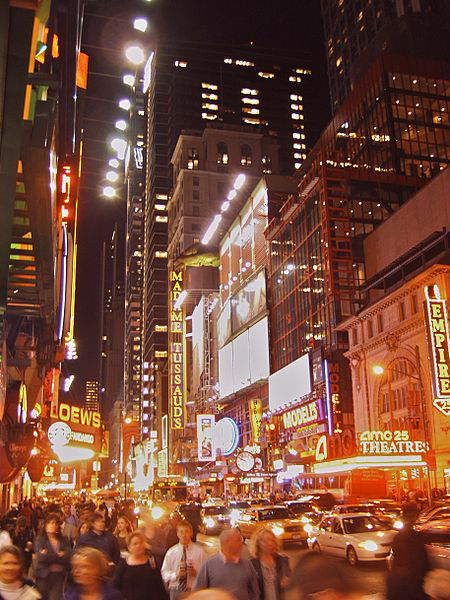

In [4]:
# Just for showing images
from PIL import Image
from io import BytesIO
import requests

url = "https://upload.wikimedia.org/wikipedia/commons/thumb/1/12/Broadway_and_Times_Square_by_night.jpg/450px-Broadway_and_Times_Square_by_night.jpg"
image_stream = requests.get(url)

Image.open(BytesIO(image_stream.content)) #this method just prints the image inside the notebook

The analyze_image method allows us to request a text description for a given image. In the following example, we submit the request and then for each of the results, we print the corresponding tag that was found and the confidence level the model think this specific object or element is present in the picture

In [5]:
image_analysis = client.analyze_image(url,visual_features=[VisualFeatureTypes.tags])

for tag in image_analysis.tags:
    print(tag)

{'additional_properties': {}, 'name': 'skyscraper', 'confidence': 0.9977022409439087, 'hint': None}
{'additional_properties': {}, 'name': 'building', 'confidence': 0.990576982498169, 'hint': None}
{'additional_properties': {}, 'name': 'outdoor', 'confidence': 0.9827473759651184, 'hint': None}
{'additional_properties': {}, 'name': 'light', 'confidence': 0.9163999557495117, 'hint': None}
{'additional_properties': {}, 'name': 'street', 'confidence': 0.9102482199668884, 'hint': None}
{'additional_properties': {}, 'name': 'downtown', 'confidence': 0.8738451600074768, 'hint': None}
{'additional_properties': {}, 'name': 'cityscape', 'confidence': 0.8567534685134888, 'hint': None}
{'additional_properties': {}, 'name': 'sky', 'confidence': 0.8022665977478027, 'hint': None}
{'additional_properties': {}, 'name': 'city', 'confidence': 0.7875664234161377, 'hint': None}
{'additional_properties': {}, 'name': 'street light', 'confidence': 0.6956691145896912, 'hint': None}
{'additional_properties': {},

### A.2) Get subject domain list

In [31]:
models = client.list_models()

for x in models.models_property:
    print(x.name)

celebrities
landmarks


### A.3) Analyze an image by domain
You can analyze an image by subject domain with analyze_image_by_domain. Get the list of supported subject domains in order to use the correct domain name.

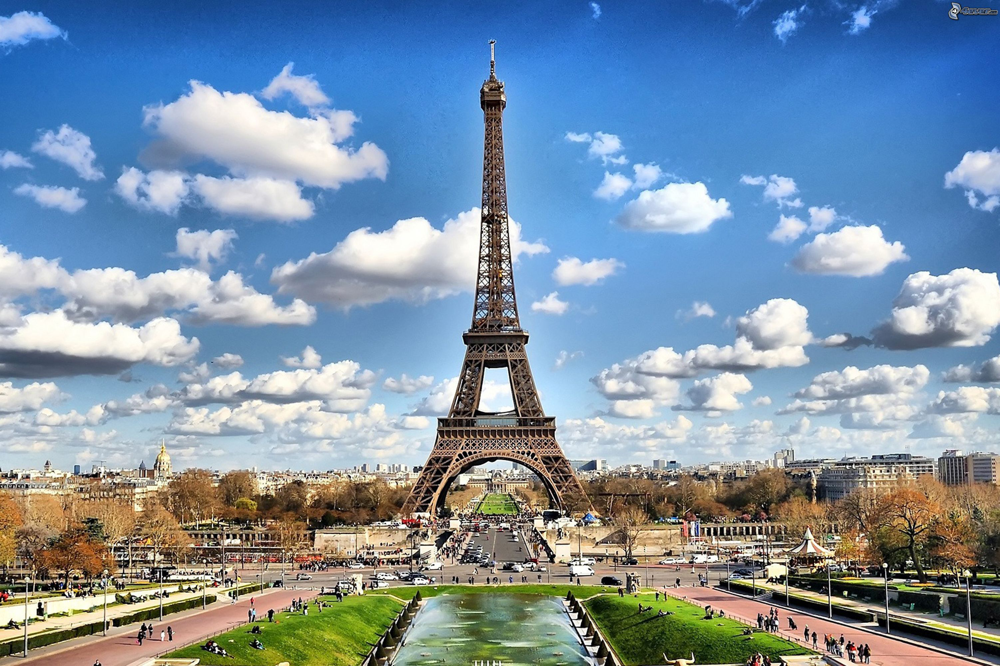

In [6]:
# Public domain image of Eiffel tower
url = "https://images.pexels.com/photos/338515/pexels-photo-338515.jpeg"

image_stream = requests.get(url)
Image.open(BytesIO(image_stream.content))

In [12]:
# type of prediction
domain = "landmarks"

# Spanish language response
language = "es"

analysis = client.analyze_image_by_domain(domain, url, language)

for landmark in analysis.result["landmarks"]:
    print(landmark["name"])
    print(landmark["confidence"])

Torre Eiffel
0.972873866558075


### A.4) Get text description of an image
You can get a language-based text description of an image with describe_image. Request several descriptions with the max_description property if you are doing text analysis for keywords associated with the image. Examples of a text description for the following image include a train crossing a bridge over a body of water, a large bridge over a body of water, and a train crossing a bridge over a large body of water.

In [13]:
domain = "landmarks"
url = "http://www.public-domain-photos.com/free-stock-photos-4/travel/san-francisco/golden-gate-bridge-in-san-francisco.jpg"
language = "es"
max_descriptions = 3

analysis = client.describe_image(url, max_descriptions, language)

for caption in analysis.captions:
    print(caption.text)
    print(caption.confidence)

Puente Golden Gate sobre un cuerpo de agua
0.7013705644202353
Puente Golden Gate sobre un río
0.6873738577161355
puente sobre un cuerpo de agua con Puente Golden Gate de fondo
0.6863738577161355


### A.5) Get text from image
You can get any handwritten or printed text from an image. This requires two calls to the SDK: recognize_text and get_text_operation_result. The call to recognize_text is asynchronous. In the results of the get_text_operation_result call, you need to check if the first call completed with TextOperationStatusCodes before extracting the text data. The results include the text as well as the bounding box coordinates for the text.

In [57]:
from azure.cognitiveservices.vision.computervision.models import TextRecognitionMode
from azure.cognitiveservices.vision.computervision.models import TextOperationStatusCodes
import time

In [59]:
url = "https://azurecomcdn.azureedge.net/cvt-1979217d3d0d31c5c87cbd991bccfee2d184b55eeb4081200012bdaf6a65601a/images/shared/cognitive-services-demos/read-text/read-1-thumbnail.png"
mode = TextRecognitionMode.handwritten
raw = True
custom_headers = None
numberOfCharsInOperationId = 36

# Async SDK call
rawHttpResponse = client.recognize_text(url, mode, custom_headers,  raw)

# Get ID from returned headers
operationLocation = rawHttpResponse.headers["Operation-Location"]
idLocation = len(operationLocation) - numberOfCharsInOperationId
operationId = operationLocation[idLocation:]

result = client.get_text_operation_result(operationId)

# SDK call
while result.status in ['NotStarted', 'Running']:
    time.sleep(1)
    result = client.get_text_operation_result(operationId)

# Get data
if result.status == TextOperationStatusCodes.succeeded:
    for line in result.recognition_result.lines:
        print(line.text)
        print(line.bounding_box)

Deserializer is not able to find NotStarted as valid enum in <enum 'TextOperationStatusCodes'>


Sorry !
[11, 35, 54, 29, 55, 49, 12, 53]
Have a
[85, 42, 136, 35, 138, 49, 87, 57]
nice day !
[83, 58, 148, 51, 150, 66, 85, 73]
Oops !
[22, 75, 59, 72, 60, 93, 22, 94]
Bye !
[123, 97, 154, 96, 155, 111, 123, 113]
See you Soon !
[15, 116, 98, 111, 99, 126, 16, 131]


## B) Text: Install the SDK

The Text Analytics API is a cloud-based service that provides advanced natural language processing over raw text, and includes four main functions: sentiment analysis, key phrase extraction, language detection, and entity recognition. Text analysis can mean different things, but in Cognitive Services, the Text Analytics API provides four types of analysis as described below.

But first, we need to install the Python package to use this functionalities

In [4]:
!pip install azure-cognitiveservices-language-textanalytics

     |████████████████████████████████| 51kB 4.3MB/s eta 0:00:01
You should consider upgrading via the 'pip install --upgrade pip' command.


### B.1) Sentiment analysis

Use sentiment analysis to find out what customers think of your brand or topic by analyzing raw text for clues about positive or negative sentiment. This API returns a sentiment score between 0 and 1 for each document. Scores close to 1 indicate positive sentiment, while scores close to 0 indicate negative sentiment.

In [9]:
from azure.cognitiveservices.language.textanalytics import TextAnalyticsClient

client = TextAnalyticsClient(endpoint=ENDPOINT, credentials=credentials)

In [10]:
documents = [{
    'language': 'en',
    'id': 0,
    'text': "I had the best day of my life."
}, {
    'language': 'en',
    'id': 1,
    'text': "This was a waste of my time. The speaker put me to sleep."
}, {
    'language': 'es',
    'id': 2,
    'text': "No tengo dinero ni nada que dar..."
}, {
    'language': 'fr',
    'id': 3,
    'text': "Comme ce n'est pas cher, je n'ai pas confiance"
}]

for document in documents:
    print("Asking sentiment on '{}' (id: {})".format(document['text'], document['id']))

response = client.sentiment(
    documents=documents
)

for document in response.documents:
    print("Found out that in document {}, sentimet score is {}:".format(document.id, document.score))

Asking sentiment on 'I had the best day of my life.' (id: 0)
Asking sentiment on 'This was a waste of my time. The speaker put me to sleep.' (id: 1)
Asking sentiment on 'No tengo dinero ni nada que dar...' (id: 2)
Asking sentiment on 'Comme ce n'est pas cher, je n'ai pas confiance' (id: 3)
Found out that in document 0, sentimet score is 0.8723785877227783:
Found out that in document 1, sentimet score is 0.1059873104095459:
Found out that in document 2, sentimet score is 0.43635445833206177:
Found out that in document 3, sentimet score is 0.1989094614982605:


### B.2) Key Phrase Extraction

Automatically extract key phrases to quickly identify the main points. For example, for the input text "The food was delicious and there were wonderful staff", the API returns the main talking points: "food" and "wonderful staff". Let's start by creating some text we can use to analyze later

In [11]:
documents = [
    {
        "id": "1", 
        "language": "en",
        "text": "My cat might need to see a veterinarian."
    },
    {
        "id": "2", 
        "language": "es", 
        "text": "A mi me encanta el fútbol!"
    }
]

In [12]:
response = client.key_phrases(documents=documents)

for document in response.documents:
    print("Document Id: ", document.id)
    print("\tKey Phrases:")
    for phrase in document.key_phrases:
        print("\t\t",phrase)

Document Id:  1
	Key Phrases:
		 cat
		 veterinarian
Document Id:  2
	Key Phrases:
		 fútbol


# Putting all the pieces together using Power BI

The Text Analytics service, part of Microsoft Azure Cognitive Services, provides natural language processing. Given raw unstructured text, it can extract the most important phrases, analyze sentiment, and identify well-known entities such as brands. We are going to create a dashboard en Power BI to analyze the comments people have done in a company. Those comments were saved in CSV file for your convenience. The outcome should look like something like this:

<img src='https://notebooks.azure.com/fasantia/projects/hol-cognitive-demos/raw/hol-cognitiveservices-text.PNG' width='900' />

## Load customer data

To get started, open Power BI Desktop and load the comma-separated value (CSV) file FabrikamComments.csv. This file represents a day's worth of hypothetical activity in a fictional small company's support forum. 
<br />
<p><img src="https://docs.microsoft.com/en-us/azure/cognitive-services/text-analytics/media/tutorials/power-bi/invoke-custom-function-button.png" alt="[The Get Data button]" data-linktype="relative-path"></p>

You may need to transform your data in Power BI Desktop before it's ready to be processed by the Key Phrases API of the Text Analytics service. The sample data contains a subject column and a comment column. With the Merge Columns function in Power BI Desktop, you can extract key phrases from the data in both these columns, rather than just the comment column:
<ol>
    <li>In Power BI Desktop, select the Home ribbon. In the External data group, click Edit Queries.</li>
    <li>Select FabrikamComments in the Queries list at the left side of the window if it isn't already selected.</li>
    <li>Now select both the subject and comment columns in the table. You may need to scroll horizontally to see these columns. First click the subject column header, then hold down the Control key and click the comment column header.</li>
    <li>Select the Transform ribbon. In the Text Columns group of the ribbon, click Merge Columns. The Merge Columns dialog appears. Select space as separator and accept.</li>
</ol>

## Create a custom function

Now you're ready to create the custom function that will integrate Power BI and Text Analytics. The function receives the text to be processed as a parameter. It converts data to and from the required JSON format and makes the HTTP request to the Key Phrases API. The function then parses the response from the API and returns a string that contains a comma-separated list of the extracted key phrases.

<ol>
    <li>In Power BI Desktop, make sure you're still in the Query Editor window. If you aren't, select the Home ribbon, and in the External data group, click Edit Queries.</li>
    <li>Now, in the Home ribbon, in the New Query group, open the New Source drop-down menu and select Blank Query.</li>
    <li>A new query, initially named Query1, appears in the Queries list. Double-click this entry and name it KeyPhrases.</li>
    <li>Now, in the Home ribbon, in the Query group, click Advanced Editor to open the Advanced Editor window. Delete the code that's already in that window and paste in the following code.</li>
</ol>

```
// Returns key phrases from the text in a comma-separated list
(text) => let
    apikey      = "YOUR_API_KEY_HERE",
    endpoint    = "https://eastus.api.cognitive.microsoft.com/text/analytics/v2.1/keyPhrases",
    jsontext    = Text.FromBinary(Json.FromValue(Text.Start(Text.Trim(text), 5000))),
    jsonbody    = "{ documents: [ { language: ""en"", id: ""0"", text: " & jsontext & " } ] }",
    bytesbody   = Text.ToBinary(jsonbody),
    headers     = [#"Ocp-Apim-Subscription-Key" = apikey],
    bytesresp   = Web.Contents(endpoint, [Headers=headers, Content=bytesbody]),
    jsonresp    = Json.Document(bytesresp),
    keyphrases  = Text.Lower(Text.Combine(jsonresp[documents]{0}[keyPhrases], ", "))
in  keyphrases
```

Repeat the same but now creating a function with name Sentiment. Use the following code:

```
// Returns the sentiment score of the text, from 0.0 (least favorable) to 1.0 (most favorable)
(text) => let
    apikey      = "YOUR_API_KEY_HERE",
    endpoint    = "https://eastus.api.cognitive.microsoft.com/text/analytics/v2.1/sentiment",
    jsontext    = Text.FromBinary(Json.FromValue(Text.Start(Text.Trim(text), 5000))),
    jsonbody    = "{ documents: [ { language: ""en"", id: ""0"", text: " & jsontext & " } ] }",
    bytesbody   = Text.ToBinary(jsonbody),
    headers     = [#"Ocp-Apim-Subscription-Key" = apikey],
    bytesresp   = Web.Contents(endpoint, [Headers=headers, Content=bytesbody]),
    jsonresp    = Json.Document(bytesresp),
    sentiment   = jsonresp[documents]{0}[score]
in  sentiment
```

## Call the functions

In Power BI Desktop, in the Query Editor window, switch back to the FabrikamComments query. Select the Add Column ribbon. In the General group, click Invoke Custom Function. 

<img src='https://docs.microsoft.com/en-us/azure/cognitive-services/text-analytics/media/tutorials/power-bi/invoke-custom-function-button.png' width='400' />

The Invoke Custom Function dialog appears. In New column name, enter keyphrases. In Function query, select the custom function you created, KeyPhrases.

A new field appears in the dialog, text (optional). This field is asking which column we want to use to provide values for the text parameter of the Key Phrases API. (Remember that you already hard-coded the values for the language and id parameters.) Select Merged (the column you created previously by merging the subject and message fields) from the drop-down menu.

<img src='https://docs.microsoft.com/en-us/azure/cognitive-services/text-analytics/media/tutorials/power-bi/invoke-custom-function.png' width='600' />

Repeat again using the function Sentiment. <b>After doing that, remember to change the type of the new column created to Decimal. This will allow us to later use this column with calculations.</b>

## Create the word cloud and the gauge

Once you have dealt with any banners that appear, click Close & Apply in the Home ribbon to close the Query Editor.

Power BI Desktop takes a moment to make the necessary HTTP requests. For each row in the table, the new keyphrases column contains the key phrases detected in the text by the Key Phrases API.

Now you'll use this column to generate a word cloud. To get started, click the Report button in the main Power BI Desktop window, to the left of the workspace.

### Install the word cloud visual

In the Visualizations panel to the right of the workspace, click the three dots (...) and choose Import From Store. Then search for "cloud" and click the Add button next the Word Cloud visual. Power BI installs the Word Cloud visual and lets you know that it installed successfully.

<img src='https://docs.microsoft.com/en-us/azure/cognitive-services/text-analytics/media/tutorials/power-bi/add-custom-visuals.png' width='600' />

### Add the word cloud

First, click the Word Cloud icon in the Visualizations panel. A new report appears in the workspace. Drag the keyphrases field from the Fields panel to the Category field in the Visualizations panel. The word cloud appears inside the report.

<img src='https://docs.microsoft.com/en-us/azure/cognitive-services/text-analytics/media/tutorials/power-bi/visualizations-panel.png' width='200' />

Now switch to the Format page of the Visualizations panel. In the Stop Words category, turn on Default Stop Words to eliminate short, common words like "of" from the cloud.

### Add the gauge visual

Now, it's time to add the gauge for the sentiment score:
<ol>
    <li>Add the gauge item from the panel</li>
    <img src='https://docs.microsoft.com/en-us/power-bi/visuals/media/power-bi-visualization-radial-gauge-charts/power-bi-roller.png' width='400' />
    <li>Drag sentiment in the Value placeholder</li>
    <li>Clic the sentiment column name in the Value placeholder and then select the function Average. This will create an average for this value</li>
</ol>

You can download a sample version of this Power BI dashboard from the repository